In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os
%matplotlib inline

Camera Caliberation

Before starting the project, it is necessary that we Caliberate the camera, and correct any distortions, as they might give a huge error during the calculations, which could be fatal in the case of Self Driving cars

Detecting the Corners in the images

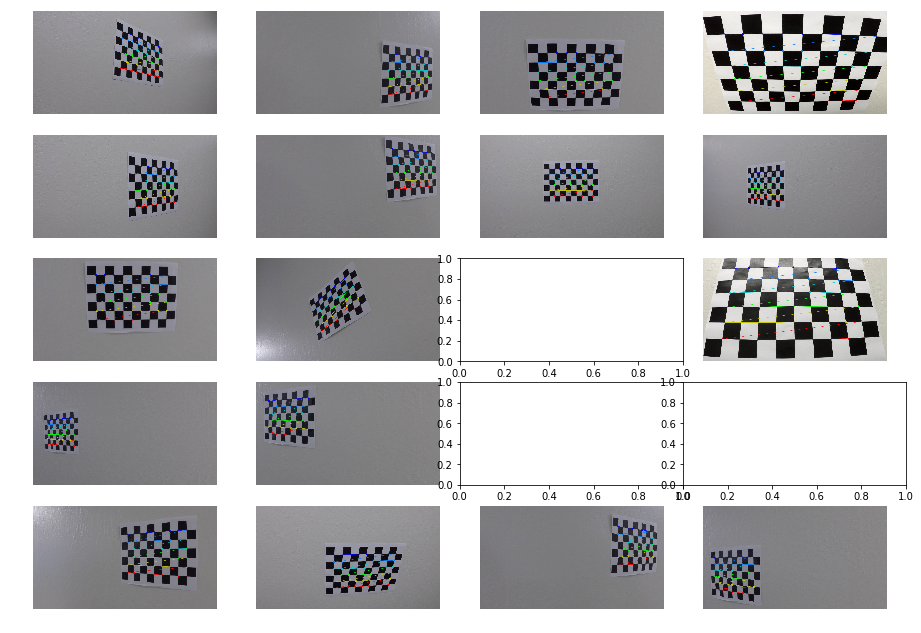

In [39]:
# The number of boxes in the image
nx = 9  # The number of inside corners in x
ny = 6  # The number of inside corners in y

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

path_of_calib_images = './camera_cal/'
list_calib_images = os.listdir(path = path_of_calib_images)

object_points = []
image_points = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

fig, axs = plt.subplots(5,4, figsize=(16, 11))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

for i,fname in enumerate(list_calib_images):
    
    img = mpimg.imread(path_of_calib_images + fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == True:
        object_points.append(objp)
        
        # For better refinement of the corners
        corners_ = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        image_points.append(corners_)
        
        # Draw the coreners for visualization
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(img)

There are 3 images from the total of 20 images in which the corner detection algorithm did'nt work, but still there was ample of data collected for the calliberation of the camera, so moving forward to the caliberation step

Text(0.5,1,'Undistorted Image')

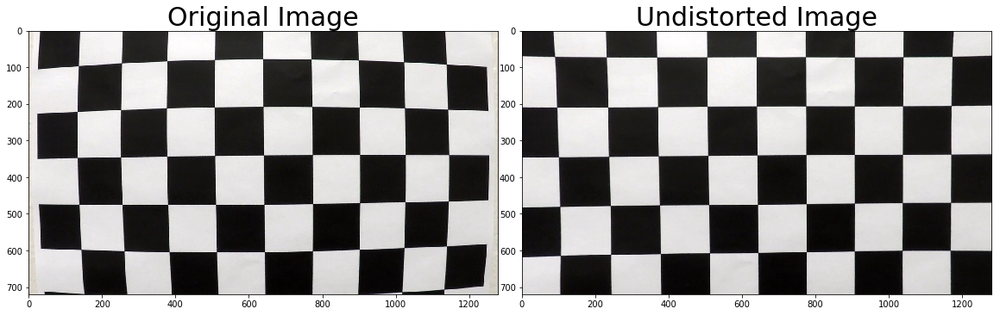

In [40]:
# Testing undistortion on an image

img = mpimg.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1],img.shape[0])

# Do the camera caliberations given the image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size, None, None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# saving the camera caliberations as a pickle file so that we can retrieve it later to undistort the images

dist_p = {}
dist_p["mtx"] = mtx
dist_p["dist"] = dist
pickle.dump(dist_p, open("caliberation.p","wb"))

# Let's look at the quality of undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

Therefore the distortion correction in the image, looks pretty decent for now

Now Let's look at how this distortion correction looks in an actual image that has been captured in a car

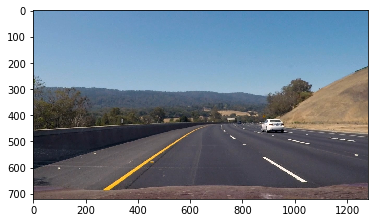

In [41]:
exImg = mpimg.imread("./test_images/test3.jpg")
# exImg = cv2.cvtColor(exImg, cv2.COLOR_BGR2RGB)
plt.imshow(exImg)

Undistorting the image

In [42]:
def undistort_img(img):
    dist_p = None
    with open('./caliberation.p','rb') as calib:
        dist_p = pickle.load(calib)
    mtx = dist_p['mtx']
    dist = dist_p['dist']
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

Text(0.5,1,'Undistorted Image')

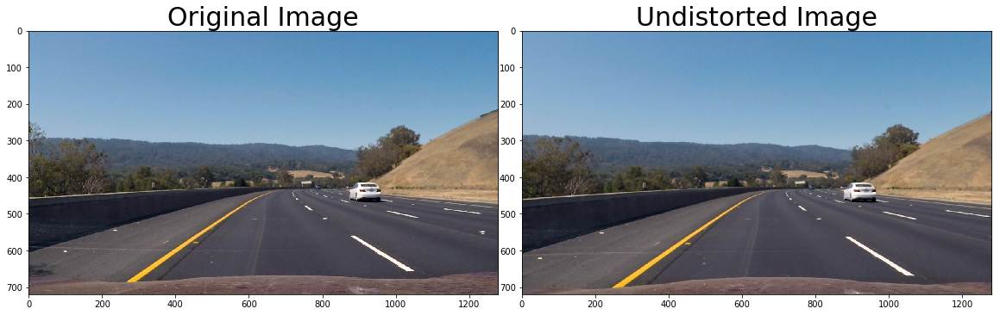

In [43]:
exImg_undistort = undistort_img(exImg)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(exImg)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(exImg_undistort)
ax2.set_title('Undistorted Image', fontsize=30)

Perspective tranform:

Moving on the next step towards our pipeline after undistorting the images is taking the perspective tranform

This will be done in some of the following steps, first we will be detecting the lane lines in the image, and then we will be going forward with actually thaking the perspective transform, which will give us a better view of the road, so that we can fit a polynomial on the lane lines, which will act as a boundry for detecting the complete lane

There is a need to perform the perspective transform so that we can appropriately detect the lane lines even when they are far off from the location of the car, where the image was captured.

First let's look at the different thresholding of the images, and try to extract the lane lines from the image, from the different types of sobel thresholds that we learnt

In [44]:
# First let's have a look at how the perspective transform works for the image that we are working on currently

def warp(img, src, dst):
    h,w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags = cv2.INTER_LINEAR)
    return warped, M, Minv

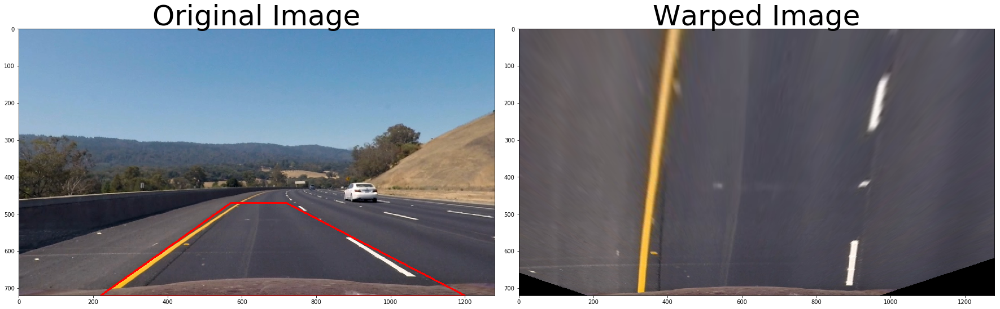

In [45]:
# Let's visualize the perspective transform in the image
img = exImg_undistort

# Manually extracted points from the image, to perform the perspective transform

bottom_left = [220,720]
bottom_right = [1200,720]
top_left = [570, 470]
top_right = [720, 470]

src = np.float32([bottom_left,bottom_right,top_left,top_right])

pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
pts = pts.reshape((-1,1,2))
copy = img.copy()
cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)

# Choosing the destination points as straight lines, so that we can perform the perspective transform

bottom_left = [320, 720]
bottom_right = [920,720]
top_left = [320, 1]
top_right = [920, 1]

dst = np.float32([bottom_left, bottom_right, top_left, top_right])

img_size = (img.shape[1], img.shape[0])

warped, M, Minv = warp(img, src, dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

As seen the unwarped image is much better to work on than the orignal unwarped image as it will be much easier to fit a polynomial on this image as compared to the unwarped image

Now, Let's explore the color spaces and try thresholding using the Sobel Kernel approach to try and extract the lane lines

First let's write all the functions that we will be using in the process


After playing around with many of these function listed below, created a final pipeline ( function : thresholding_pipeline()) and then finally a wrapper function to return the thresholded image )

In [94]:
def abs_sobel_gradient(img, orient = 'x', sobel_kernel = 3 ,abs_thresh = (0,255)):
    sobel = None
    if (orient=='x'):
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_sobel = np.zeros_like(scaled_sobel)
    binary_sobel[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1
    return binary_sobel

def mag_threshold(img, sobel_kernel = 3, mag_thresh = (0,255)):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255.0
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def direction_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2.0)):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def combined_thresh(img, sobel_kernel,abs_thresh = (0,255), mag_thresh = (0,255), ang_thresh = (0, np.pi/2.0)):
    img_absx = abs_sobel_gradient(img, 'x', sobel_kernel ,abs_thresh)
    img_absy = abs_sobel_gradient(img, 'y', sobel_kernel ,abs_thresh)
    img_mag = mag_threshold(img, sobel_kernel, mag_thresh)
    img_dir = direction_threshold(img, sobel_kernel, ang_thresh)
    combined = np.zeros_like(img_dir)
    combined[((img_absx==1) & (img_absy==1)) | ((img_mag==1) & (img_dir==1))] = 1
    return combined

def color_thresholding(img, color_thresh = 100):
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_thresh) & (G > color_thresh)
    return r_g_condition

def hls_threshold(img, s_thresh = (0,255), l_thresh = (0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    l = hls[:,:,1]
    s_cond = (s > s_thresh[0]) & (s <= s_thresh[1])
    l_cond = (l > l_thresh[0]) & (l <= l_thresh[1])
    return s_cond, l_cond
    
def thresholding_pipeline(img):
    img = undistort_img(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sx_binary = abs_sobel_gradient(gray, 'x', abs_thresh=(20,100))
    dir_binary = direction_threshold(gray, thresh=(np.pi/6.0, np.pi/2.0))
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    R = img[:,:,2]
    color_combined = np.zeros_like(R)
    r_g_condition = color_thresholding(img, 170)
    
    s_cond, l_cond = hls_threshold(img, s_thresh = (110,255), l_thresh = (120,255))
    color_combined[(r_g_condition & l_cond) | (s_cond & combined_condition)] = 1
    return color_combined

def threshold(img):
    height, width = img.shape[:2]
    color_combined = thresholding_pipeline(img)
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    return thresholded

Now let's look at the binary thresholding actually on a couple of images

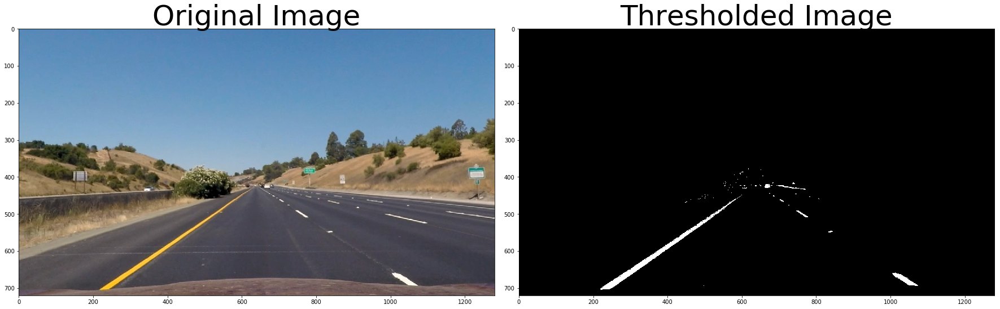

In [100]:
img = mpimg.imread('./test_images/straight_lines1.jpg')
thresholded = threshold(img)
img = undistort_img(img)

# Plot these images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

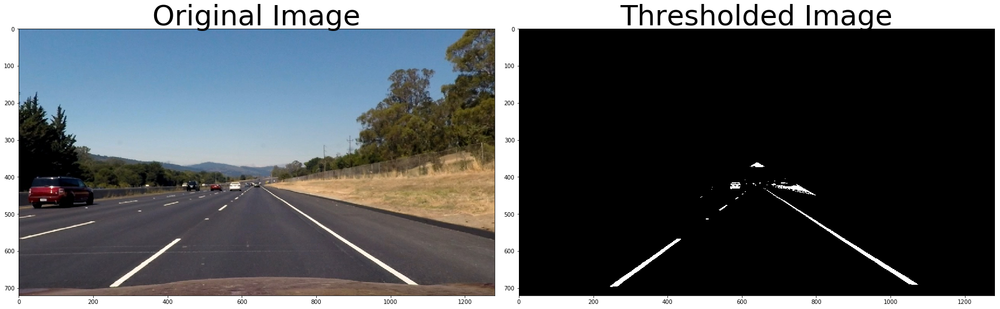

In [101]:
img = mpimg.imread('./test_images/straight_lines2.jpg')
thresholded = threshold(img)
img = undistort_img(img)

# Plot these images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Although the pipeline works fine for almost all the test images, but it is showing errors for the following :-

What can be noticed is that, the skid marks from the tyres, random change in the lighting from the sun and the shadows from the trees are causing this error, this is needed to be rectified.
So we will work some more on the this coloring pipeline

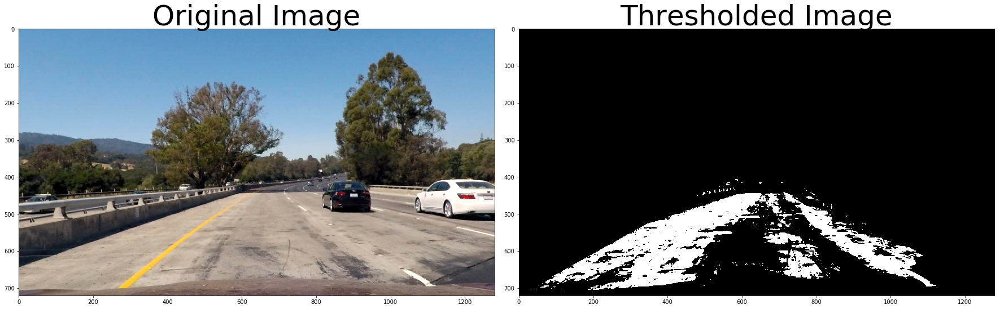

In [108]:
img = mpimg.imread('./test_images/test1.jpg')
thresholded = threshold(img)
img = undistort_img(img)

# Plot these images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

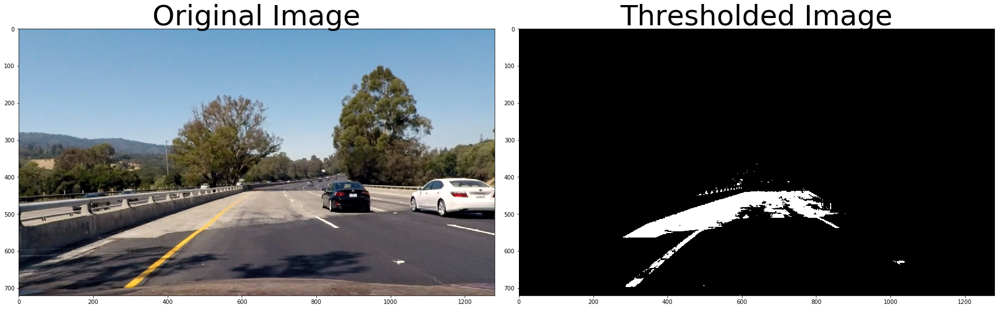

In [110]:
img = mpimg.imread('./test_images/test4.jpg')
thresholded = threshold(img)
img = undistort_img(img)

# Plot these images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

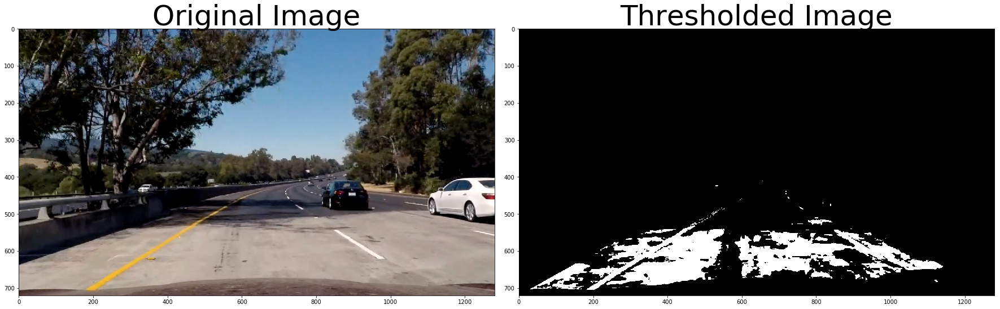

In [111]:
img = mpimg.imread('./test_images/test5.jpg')
thresholded = threshold(img)
img = undistort_img(img)

# Plot these images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Attempt to improve the thresholding technique

Text(0.5,1,'Sthresh_channel')

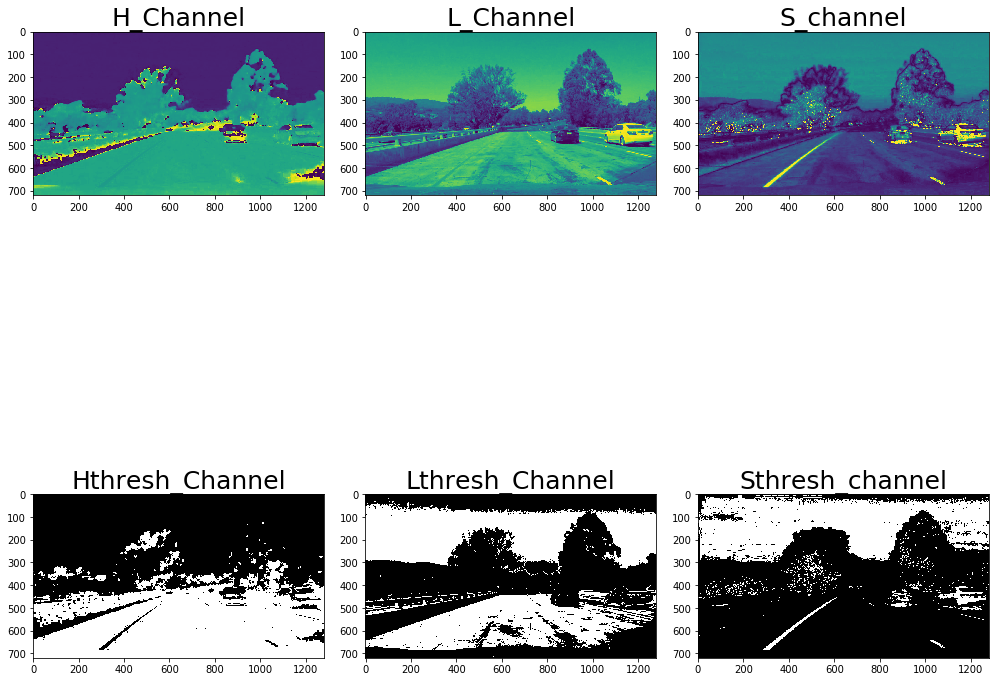

In [142]:
img = cv2.imread('./test_images/test1.jpg')
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
h = hls[:,:,0]
l = hls[:,:,1]
s = hls[:,:,2]
h_thresh = np.zeros_like(h)
l_thresh = np.zeros_like(h)
s_thresh = np.zeros_like(h)
h_thresh[(h > 100) & (h <= 200)] = 1
l_thresh[(l > 150) & (l <= 200)] = 1
s_thresh[(s > 120) & (s <= 255)] = 1
f, axs = plt.subplots(2,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(h)
axs[0][0].set_title('H_Channel', fontsize=25)
axs[0][1].imshow(l)
axs[0][1].set_title('L_Channel', fontsize=25)
axs[0][2].imshow(s)
axs[0][2].set_title('S_channel', fontsize=25)
axs[1][0].imshow(h_thresh, cmap='gray')
axs[1][0].set_title('Hthresh_Channel', fontsize=25)
axs[1][1].imshow(l_thresh,cmap='gray')
axs[1][1].set_title('Lthresh_Channel', fontsize=25)
axs[1][2].imshow(s_thresh,cmap='gray')
axs[1][2].set_title('Sthresh_channel', fontsize=25)


Text(0.5,1,'Sthresh_channel')

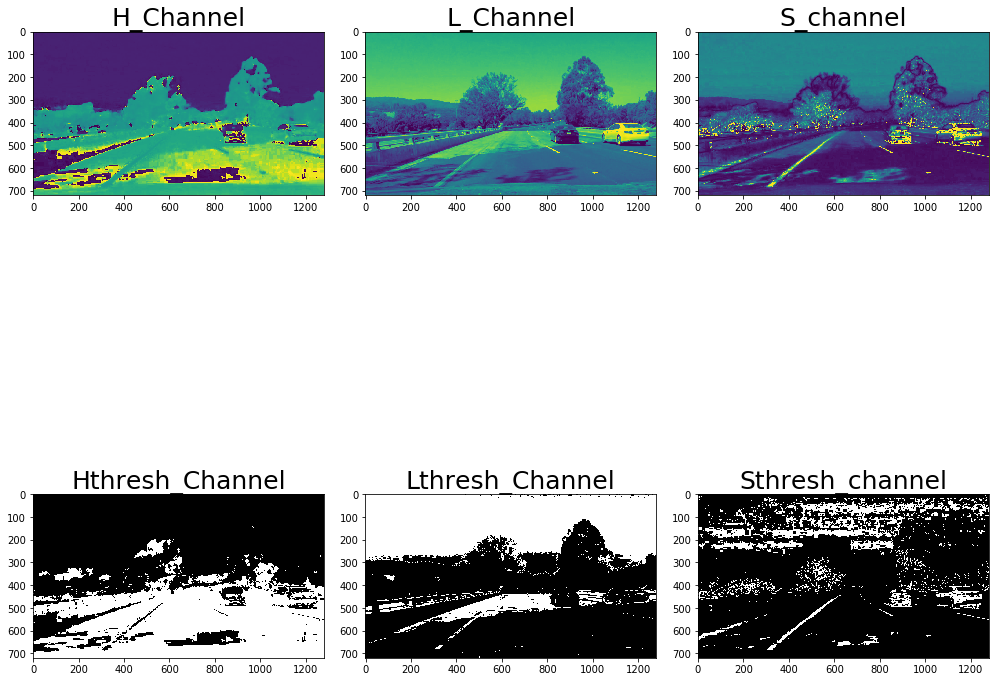

In [143]:
img = cv2.imread('./test_images/test4.jpg')
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
h = hls[:,:,0]
l = hls[:,:,1]
s = hls[:,:,2]
h_thresh = np.zeros_like(h)
l_thresh = np.zeros_like(h)
s_thresh = np.zeros_like(h)
h_thresh[(h > 100) & (h <= 200)] = 1
l_thresh[(l > 150) & (l <= 200)] = 1
s_thresh[(s > 120) & (s <= 255)] = 1
f, axs = plt.subplots(2,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(h)
axs[0][0].set_title('H_Channel', fontsize=25)
axs[0][1].imshow(l)
axs[0][1].set_title('L_Channel', fontsize=25)
axs[0][2].imshow(s)
axs[0][2].set_title('S_channel', fontsize=25)
axs[1][0].imshow(h_thresh, cmap='gray')
axs[1][0].set_title('Hthresh_Channel', fontsize=25)
axs[1][1].imshow(l_thresh,cmap='gray')
axs[1][1].set_title('Lthresh_Channel', fontsize=25)
axs[1][2].imshow(s_thresh,cmap='gray')
axs[1][2].set_title('Sthresh_channel', fontsize=25)


Text(0.5,1,'Sthresh_channel')

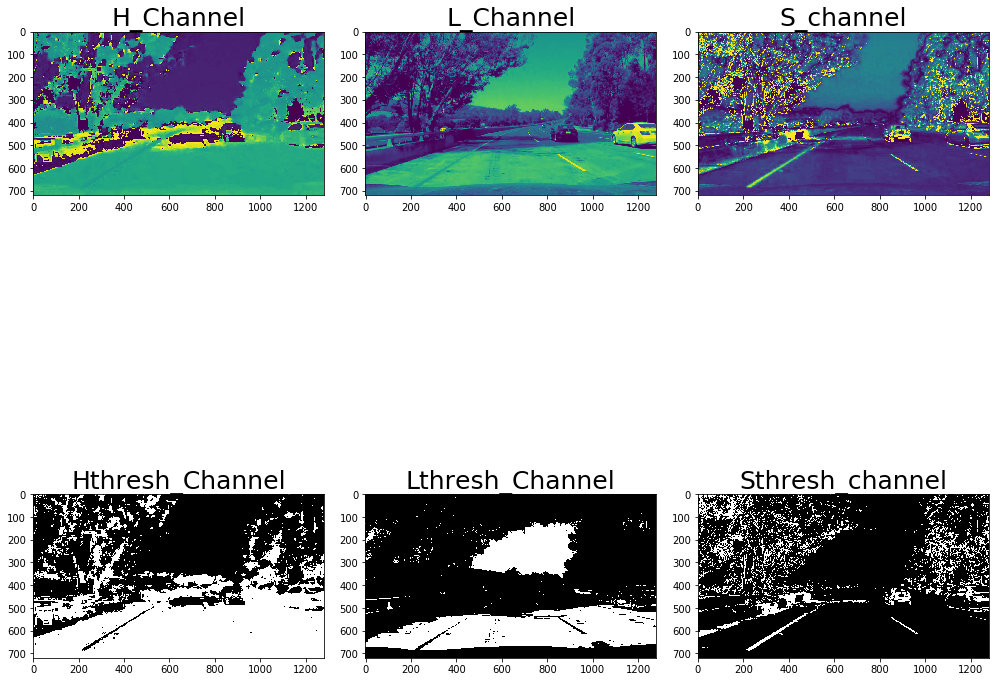

In [144]:
img = cv2.imread('./test_images/test5.jpg')
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
h = hls[:,:,0]
l = hls[:,:,1]
s = hls[:,:,2]
h_thresh = np.zeros_like(h)
l_thresh = np.zeros_like(h)
s_thresh = np.zeros_like(h)
h_thresh[(h > 100) & (h <= 200)] = 1
l_thresh[(l > 150) & (l <= 200)] = 1
s_thresh[(s > 120) & (s <= 255)] = 1
f, axs = plt.subplots(2,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(h)
axs[0][0].set_title('H_Channel', fontsize=25)
axs[0][1].imshow(l)
axs[0][1].set_title('L_Channel', fontsize=25)
axs[0][2].imshow(s)
axs[0][2].set_title('S_channel', fontsize=25)
axs[1][0].imshow(h_thresh, cmap='gray')
axs[1][0].set_title('Hthresh_Channel', fontsize=25)
axs[1][1].imshow(l_thresh,cmap='gray')
axs[1][1].set_title('Lthresh_Channel', fontsize=25)
axs[1][2].imshow(s_thresh,cmap='gray')
axs[1][2].set_title('Sthresh_channel', fontsize=25)


S channel seems to be absolutely invariant to the skid marks and the brightness from the sunlight, which were posing a huge problem in our decision, therefore we will go forward by taking the S channel

Let's visualize the abs_sobel_gradient(), mag_threshold() and direction_threshold() functions separtaley

Text(0.5,1,'y_sobel')

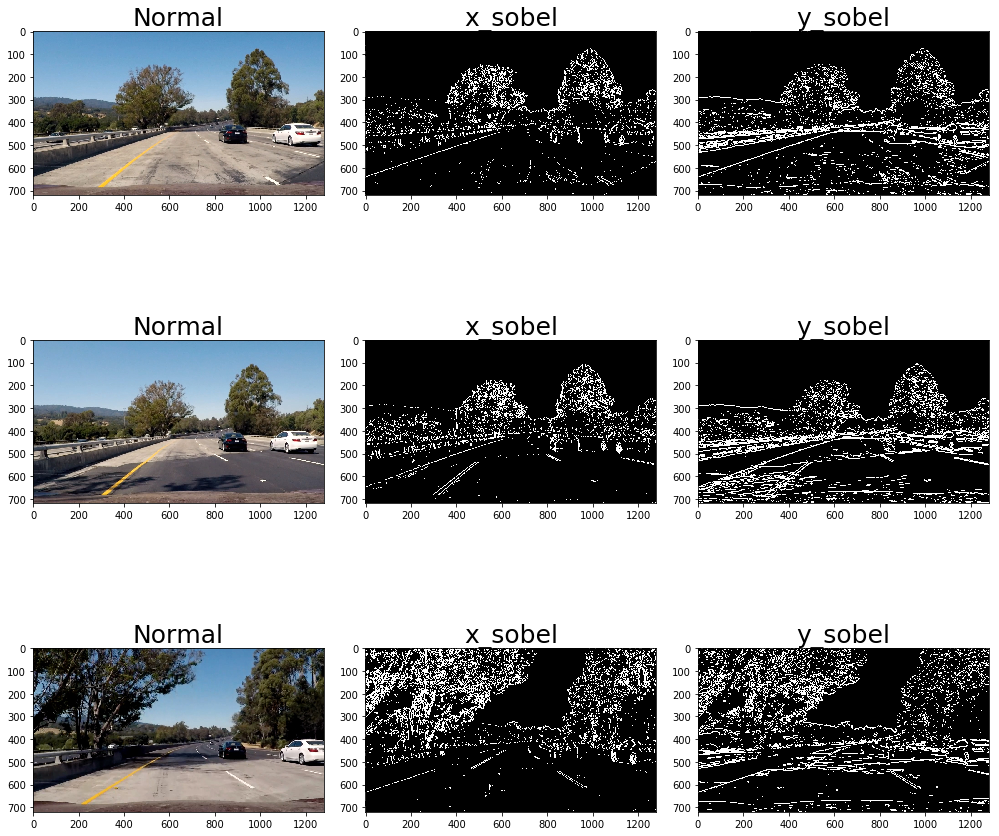

In [159]:
img1 = mpimg.imread('./test_images/test1.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
sobelx1 = abs_sobel_gradient(img1, 'x', 5, (20,180))
sobely1 = abs_sobel_gradient(img1, 'y', 5, (20,200))
sobelx4 = abs_sobel_gradient(img4, 'x', 5, (20,180))
sobely4 = abs_sobel_gradient(img4, 'y', 5, (20,200))
sobelx5 = abs_sobel_gradient(img5, 'x', 5, (20,180))
sobely5 = abs_sobel_gradient(img5, 'y', 5, (20,200))
f, axs = plt.subplots(3,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(sobelx1,cmap='gray')
axs[0][1].set_title('x_sobel', fontsize=25)
axs[0][2].imshow(sobely1,cmap='gray')
axs[0][2].set_title('y_sobel', fontsize=25)
axs[1][0].imshow(img4)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(sobelx4,cmap='gray')
axs[1][1].set_title('x_sobel', fontsize=25)
axs[1][2].imshow(sobely4,cmap='gray')
axs[1][2].set_title('y_sobel', fontsize=25)
axs[2][0].imshow(img5)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(sobelx5,cmap='gray')
axs[2][1].set_title('x_sobel', fontsize=25)
axs[2][2].imshow(sobely5,cmap='gray')
axs[2][2].set_title('y_sobel', fontsize=25)

As you can see that sobel threshold in the x direction is more robust to the noise due to sunlight and other problems that we might encounter, so we will only be considering the x_sobel

Now let's have a look at the magnitude threshold, we can play around with the mag_threshold and the kernel size of the sobel filter

Text(0.5,1,'mag_thresh')

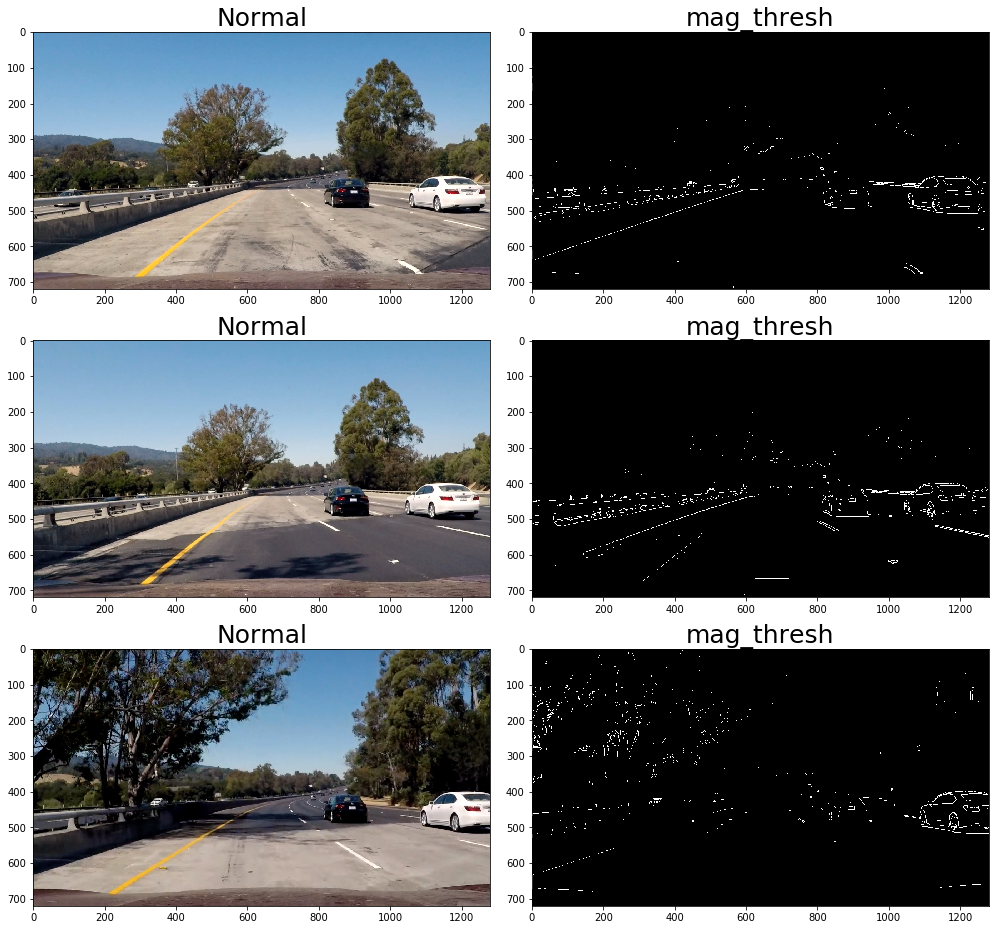

In [171]:
img1 = mpimg.imread('./test_images/test1.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
mag1 = mag_threshold(img1, 3, mag_thresh=(100,200))
mag4 = mag_threshold(img4, 3, mag_thresh=(100,200))
mag5 = mag_threshold(img5, 3, mag_thresh=(100,200))
f, axs = plt.subplots(3,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(mag1,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(img4)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(mag4,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)
axs[2][0].imshow(img5)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(mag5,cmap='gray')
axs[2][1].set_title('mag_thresh', fontsize=25)

This approach does no good for the test images, thus we will skip this step

Now moving on to the directional gradients, this will also help the images, perform better

Text(0.5,1,'mag_thresh')

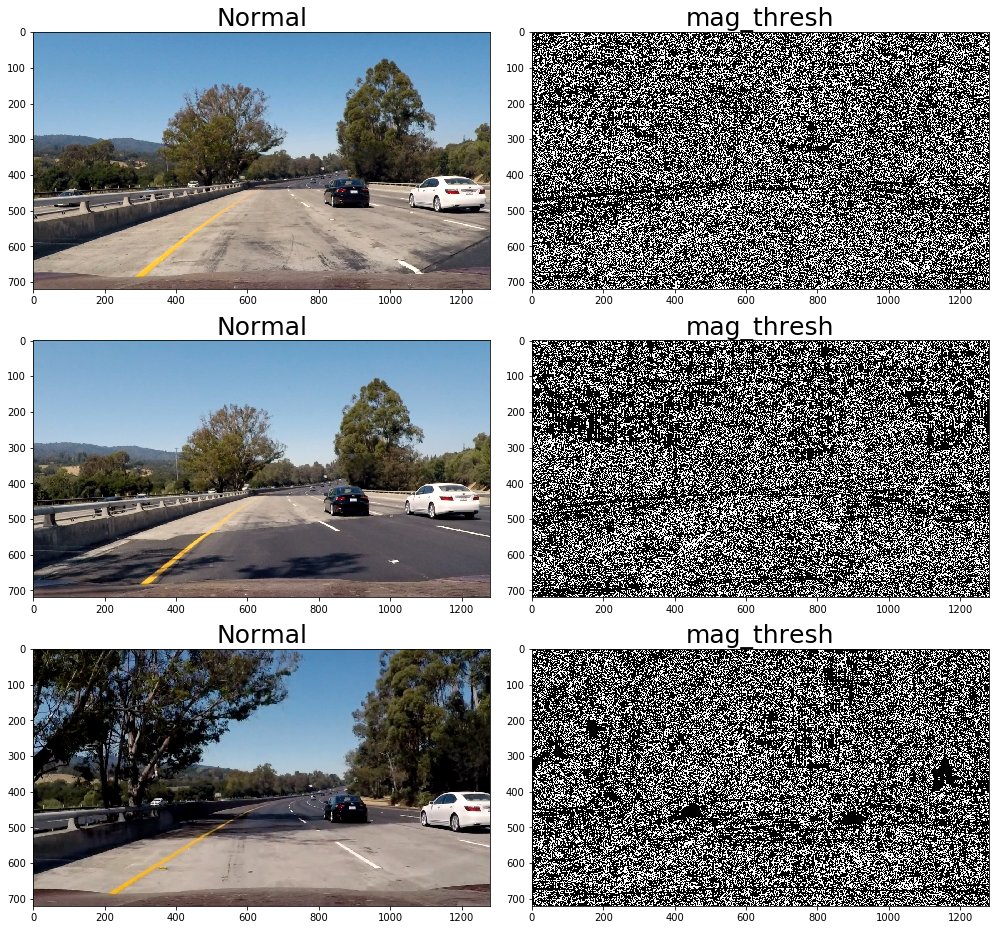

In [180]:
img1 = mpimg.imread('./test_images/test1.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
dir1 = direction_threshold(img1, 3, thresh=(0.7,1.3))
dir4 = direction_threshold(img4, 3, thresh=(0.7,1.3))
dir5 = direction_threshold(img5, 3, thresh=(0.7,1.3))
f, axs = plt.subplots(3,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(dir1,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(img4)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(dir4,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)
axs[2][0].imshow(img5)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(dir5,cmap='gray')
axs[2][1].set_title('mag_thresh', fontsize=25)

In [252]:
def abs_sobel_gradient(img, orient = 'x', sobel_kernel = 3 ,abs_thresh = (0,255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = None
    if (orient=='x'):
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_sobel = np.zeros_like(scaled_sobel)
    binary_sobel[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1
    return binary_sobel

def mag_threshold(img, sobel_kernel = 3, mag_thresh = (0,255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255.0
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def direction_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2.0)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def color_thresholding(img, thresh = (0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l = hls[:,:,1]
    s = hls[:,:,2]
    s_binary=np.zeros_like(s)
    s_binary[(s>=thresh[0]) & (s<=thresh[1])& (l>=80) ]=1
    color_output=np.copy(s_binary)
    return color_output

def final_gradient_pipeline(img):
    img = undistort_img(img)
    gradx = abs_sobel_gradient(img, 'x', 3, abs_thresh=(20,200))
    grady = abs_sobel_gradient(img, 'y', 3, abs_thresh=(20,200))
    mag_binary = mag_threshold(img, 3, mag_thresh=(20,200))
    dir_binary = direction_threshold(img, 3, thresh=(0.7,1.3))
    color_binary = color_thresholding(img, thresh=(100,255))
    combined = np.zeros_like(dir_binary)
    combined[(color_binary==1) | ((gradx == 1) | (grady == 1))  & (dir_binary==1)] = 1
    kernel = np.ones((3,3),np.uint8)
    morph_image=combined[600:,:950]
    morph_image = cv2.morphologyEx(morph_image, cv2.MORPH_OPEN, kernel)
    combined[600:,:950]=morph_image
    return combined

Text(0.5,1,'mag_thresh')

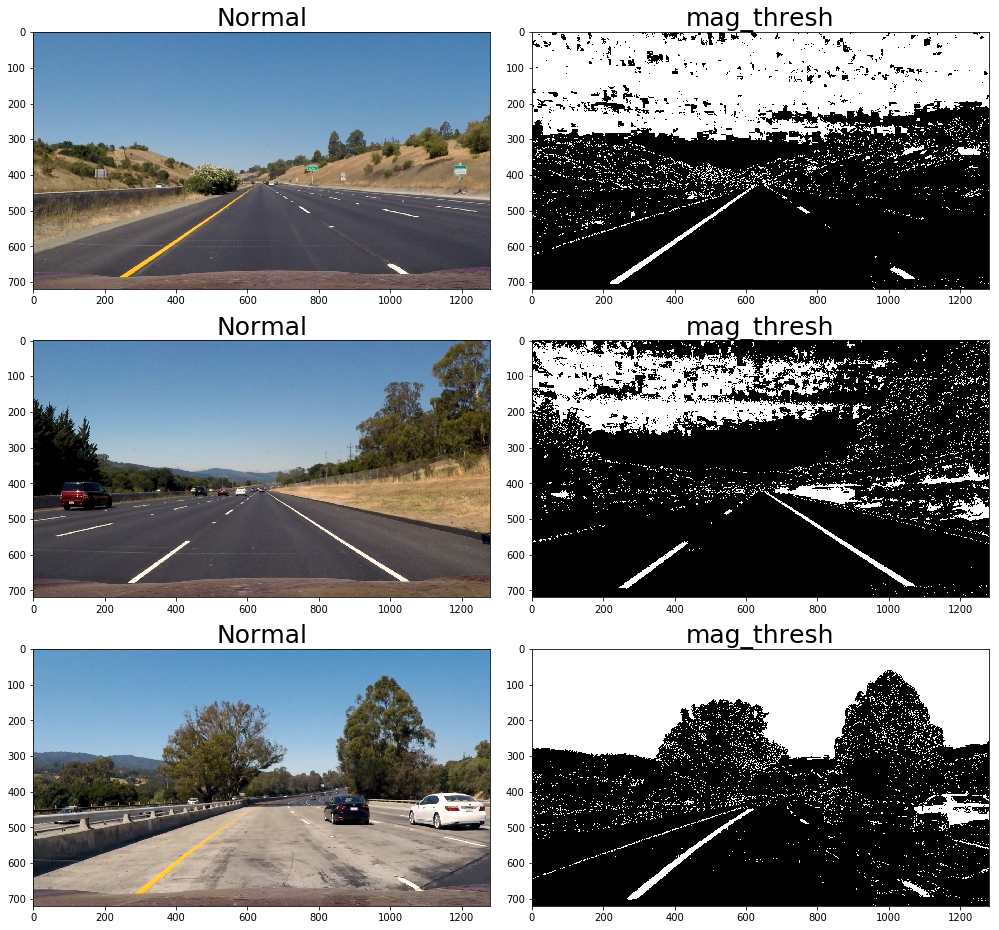

In [253]:
imgs1 = mpimg.imread('./test_images/straight_lines1.jpg')
imgs2 = mpimg.imread('./test_images/straight_lines2.jpg')
img1 = mpimg.imread('./test_images/test1.jpg')
img2 = mpimg.imread('./test_images/test2.jpg')
img3 = mpimg.imread('./test_images/test3.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
img6 = mpimg.imread('./test_images/test6.jpg')
imgs1f = final_gradient_pipeline(imgs1)
imgs2f = final_gradient_pipeline(imgs2)
img1f = final_gradient_pipeline(img1)
img2f = final_gradient_pipeline(img2)
img3f = final_gradient_pipeline(img3)
img4f = final_gradient_pipeline(img4)
img5f = final_gradient_pipeline(img5)
img6f = final_gradient_pipeline(img6)

f, axs = plt.subplots(3,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(imgs1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(imgs1f,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(imgs2)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(imgs2f,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)
axs[2][0].imshow(img1)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(img1f,cmap='gray')
axs[2][1].set_title('mag_thresh', fontsize=25)
# axs[3][0].imshow(img2)
# axs[3][0].set_title('Normal', fontsize=5)
# axs[3][1].imshow(img2f,cmap='gray')
# axs[3][1].set_title('mag_thresh', fontsize=5)
# axs[4][0].imshow(img3)
# axs[4][0].set_title('Normal', fontsize=5)
# axs[4][1].imshow(img3f,cmap='gray')
# axs[4][1].set_title('mag_thresh', fontsize=5)
# axs[5][0].imshow(img4)
# axs[5][0].set_title('Normal', fontsize=5)
# axs[5][1].imshow(img4f,cmap='gray')
# axs[5][1].set_title('mag_thresh', fontsize=5)
# axs[6][0].imshow(img5)
# axs[6][0].set_title('Normal', fontsize=5)
# axs[6][1].imshow(img5f,cmap='gray')
# axs[6][1].set_title('mag_thresh', fontsize=5)
# axs[7][0].imshow(img6)
# axs[7][0].set_title('Normal', fontsize=5)
# axs[7][1].imshow(img6f,cmap='gray')
# axs[7][1].set_title('mag_thresh', fontsize=5)

Text(0.5,1,'mag_thresh')

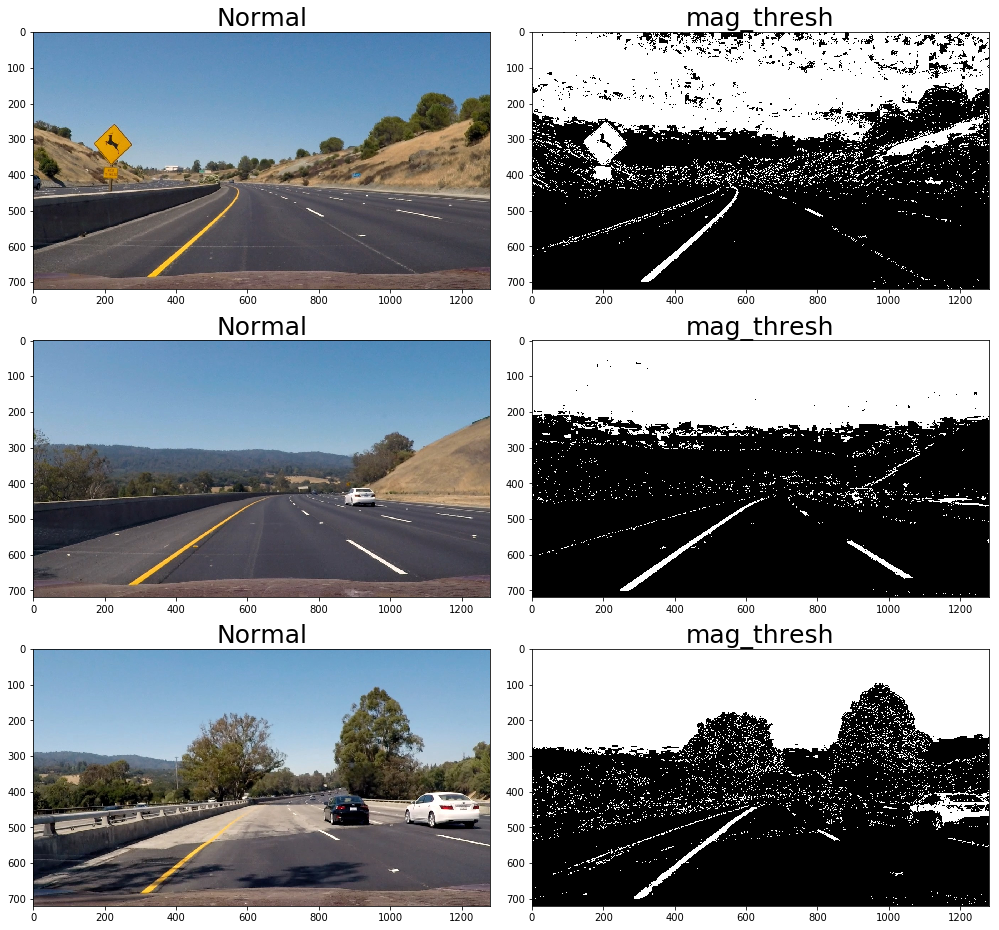

In [254]:
f, axs = plt.subplots(3,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img2)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(img2f,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(img3)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(img3f,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)
axs[2][0].imshow(img4)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(img4f,cmap='gray')
axs[2][1].set_title('mag_thresh', fontsize=25)

Text(0.5,1,'mag_thresh')

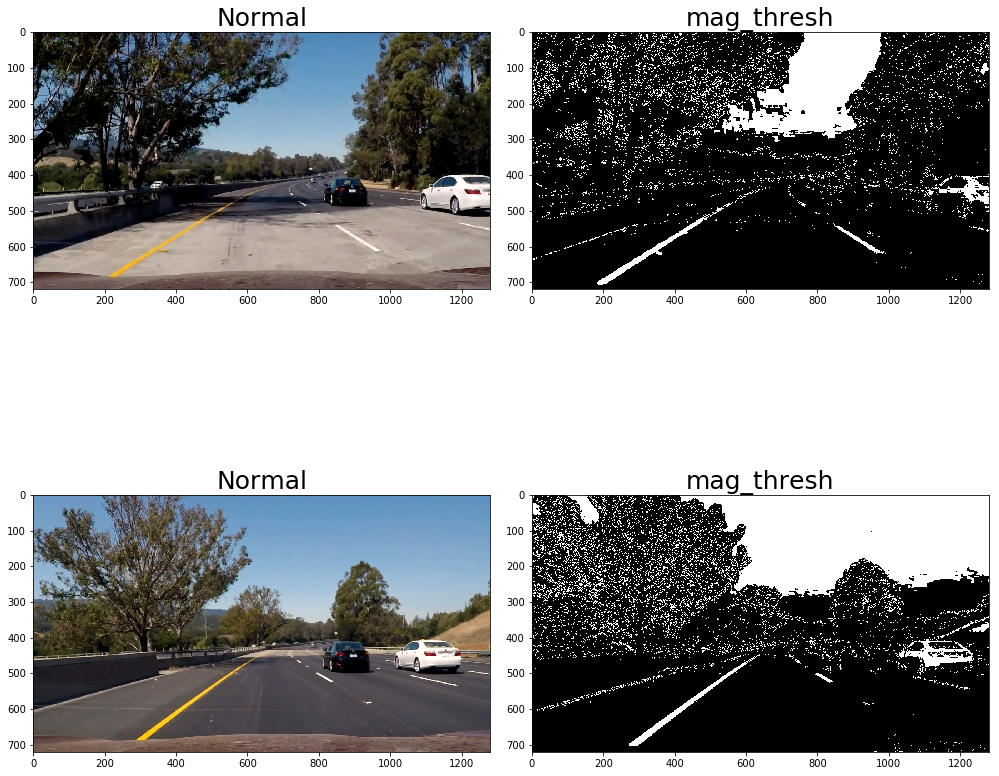

In [255]:
f, axs = plt.subplots(2,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img5)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(img5f,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(img6)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(img6f,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)

In [265]:
def get_thresholded_image(img):
    
    img = undistort_img(img)
    
    # convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # apply gradient threshold on the horizontal gradient
    sx_binary = abs_sobel_gradient(gray, 'x',3, (10,200))
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = direction_threshold(gray, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    
    # R & G thresholds so that yellow lanes are detected well.
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    # S channel performs well for detecting bright yellow and white lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    color_combined[(r_g_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # apply the region of interest mask
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    
    return thresholded
    
    
    
def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    max_value = np.max(abs_sobel)
    binary_output = np.uint8(255*abs_sobel/max_value)
    threshold_mask = np.zeros_like(binary_output)
    threshold_mask[(binary_output >= thresh_min) & (binary_output <= thresh_max)] = 1
    return threshold_mask

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction = np.arctan2(abs_sobel_y,abs_sobel_x)
    direction = np.absolute(direction)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(direction)
    mask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return mask

In [266]:
imgs1 = mpimg.imread('./test_images/straight_lines1.jpg')
imgs2 = mpimg.imread('./test_images/straight_lines2.jpg')
img1 = mpimg.imread('./test_images/test1.jpg')
img2 = mpimg.imread('./test_images/test2.jpg')
img3 = mpimg.imread('./test_images/test3.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
img6 = mpimg.imread('./test_images/test6.jpg')
imgs1f = get_thresholded_image(imgs1)
imgs2f = get_thresholded_image(imgs2)
img1f = get_thresholded_image(img1)
img2f = get_thresholded_image(img2)
img3f = get_thresholded_image(img3)
img4f = get_thresholded_image(img4)
img5f = get_thresholded_image(img5)
img6f = get_thresholded_image(img6)

f, axs = plt.subplots(3,2, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(imgs1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(imgs1f,cmap='gray')
axs[0][1].set_title('mag_thresh', fontsize=25)
axs[1][0].imshow(imgs2)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(imgs2f,cmap='gray')
axs[1][1].set_title('mag_thresh', fontsize=25)
axs[2][0].imshow(img1)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(img1f,cmap='gray')
axs[2][1].set_title('mag_thresh', fontsize=25)

error: /home/travis/miniconda/conda-bld/conda_1486587071158/work/opencv-3.1.0/modules/imgproc/src/color.cpp:7456: error: (-215) scn == 3 || scn == 4 in function ipp_cvtColor


As you can see the now the results are far better than before and all the noise because of the other factore have been ruled out. Now we can move on to the perspective transform part

In [256]:
def warp(img, src, dst):
    h,w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (w,h), flags = cv2.INTER_LINEAR)
    return warped, M, Minv

def perform_warping_task(img):
    # Manually determined points ( as mentioned before )
    bottom_left = [195,720]
    bottom_right = [1120,720]
    top_left = [590, 460]
    top_right = [700, 460]
    # Converting the src points to an array
    src = np.float32([bottom_left,bottom_right,top_left,top_right])
    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    copy = img.copy()
    cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)
#     src=np.float32([[195,720],[590,460],[700,460],[1120,720]])
#     dst=np.float32([[350,720],[410,0],[970,0],[1000,720]])
    # Choosing the destination points where the src points will be mapped
    bottom_left = [350, 720]
    bottom_right = [1000,720]
    top_left = [410, 0]
    top_right = [970, 0]
    dst = np.float32([bottom_left, bottom_right, top_left, top_right])
    img_size = (img.shape[1], img.shape[0])
    warped, M, Minv = warp(img, src, dst)
    return warped

Text(0.5,1,'Warped')

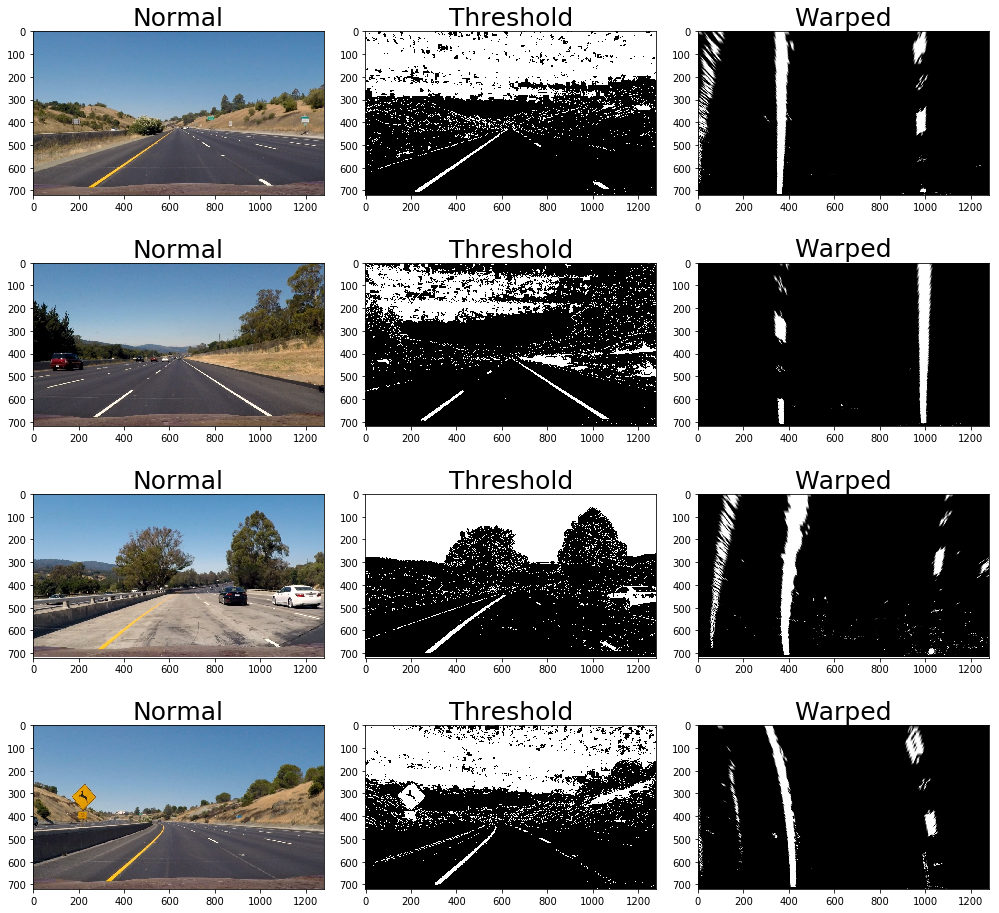

In [257]:
imgs1 = mpimg.imread('./test_images/straight_lines1.jpg')
imgs2 = mpimg.imread('./test_images/straight_lines2.jpg')
img1 = mpimg.imread('./test_images/test1.jpg')
img2 = mpimg.imread('./test_images/test2.jpg')
img3 = mpimg.imread('./test_images/test3.jpg')
img4 = mpimg.imread('./test_images/test4.jpg')
img5 = mpimg.imread('./test_images/test5.jpg')
img6 = mpimg.imread('./test_images/test6.jpg')
imgs1f = final_gradient_pipeline(imgs1)
imgs2f = final_gradient_pipeline(imgs2)
img1f = final_gradient_pipeline(img1)
img2f = final_gradient_pipeline(img2)
img3f = final_gradient_pipeline(img3)
img4f = final_gradient_pipeline(img4)
img5f = final_gradient_pipeline(img5)
img6f = final_gradient_pipeline(img6)
imgsw1 = perform_warping_task(imgs1f)
imgsw2 = perform_warping_task(imgs2f)
imgw1 = perform_warping_task(img1f)
imgw2 = perform_warping_task(img2f)
imgw3 = perform_warping_task(img3f)
imgw4 = perform_warping_task(img4f)
imgw5 = perform_warping_task(img5f)
imgw6 = perform_warping_task(img6f)

f, axs = plt.subplots(4,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(imgs1)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(imgs1f,cmap='gray')
axs[0][1].set_title('Threshold', fontsize=25)
axs[0][2].imshow(imgsw1,cmap='gray')
axs[0][2].set_title('Warped', fontsize=25)
axs[1][0].imshow(imgs2)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(imgs2f,cmap='gray')
axs[1][1].set_title('Threshold', fontsize=25)
axs[1][2].imshow(imgsw2,cmap='gray')
axs[1][2].set_title('Warped', fontsize=25)
axs[2][0].imshow(img1)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(img1f,cmap='gray')
axs[2][1].set_title('Threshold', fontsize=25)
axs[2][2].imshow(imgw1,cmap='gray')
axs[2][2].set_title('Warped', fontsize=25)
axs[3][0].imshow(img2)
axs[3][0].set_title('Normal', fontsize=25)
axs[3][1].imshow(img2f,cmap='gray')
axs[3][1].set_title('Threshold', fontsize=25)
axs[3][2].imshow(imgw2,cmap='gray')
axs[3][2].set_title('Warped', fontsize=25)

Text(0.5,1,'Warped')

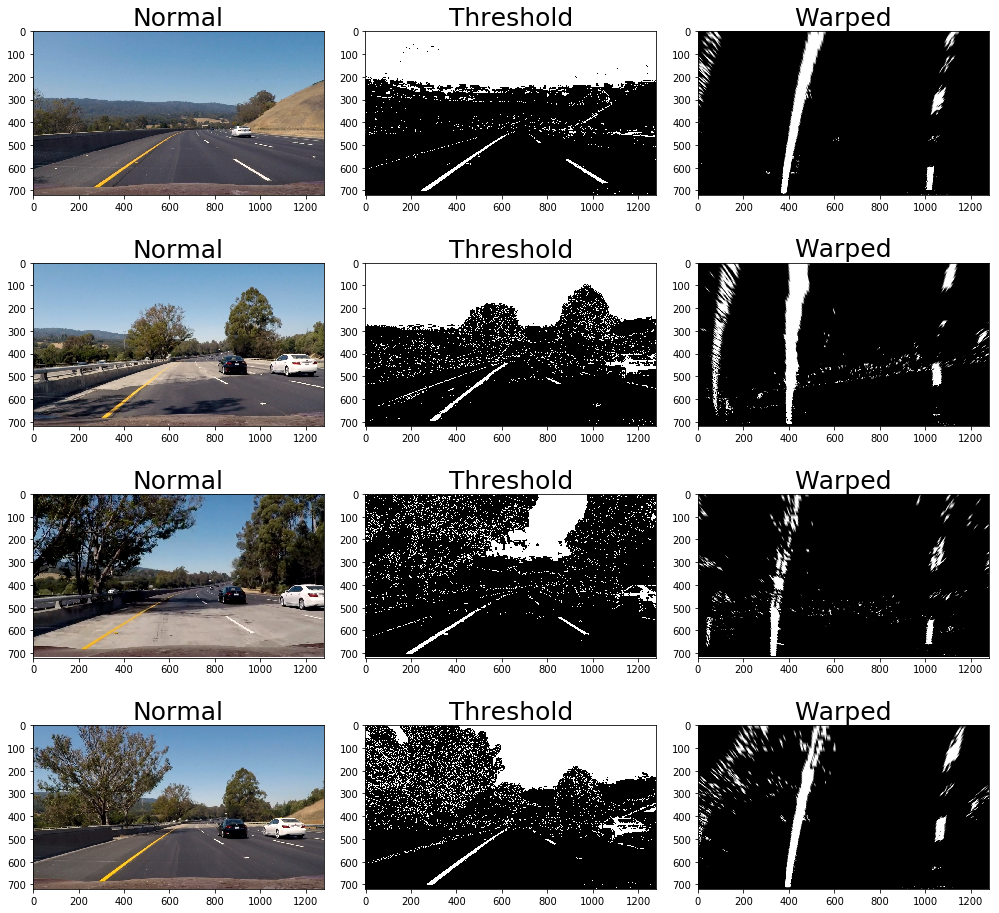

In [258]:
f, axs = plt.subplots(4,3, figsize=(14,13))
f.tight_layout()
axs[0][0].imshow(img3)
axs[0][0].set_title('Normal', fontsize=25)
axs[0][1].imshow(img3f,cmap='gray')
axs[0][1].set_title('Threshold', fontsize=25)
axs[0][2].imshow(imgw3,cmap='gray')
axs[0][2].set_title('Warped', fontsize=25)
axs[1][0].imshow(img4)
axs[1][0].set_title('Normal', fontsize=25)
axs[1][1].imshow(img4f,cmap='gray')
axs[1][1].set_title('Threshold', fontsize=25)
axs[1][2].imshow(imgw4,cmap='gray')
axs[1][2].set_title('Warped', fontsize=25)
axs[2][0].imshow(img5)
axs[2][0].set_title('Normal', fontsize=25)
axs[2][1].imshow(img5f,cmap='gray')
axs[2][1].set_title('Threshold', fontsize=25)
axs[2][2].imshow(imgw5,cmap='gray')
axs[2][2].set_title('Warped', fontsize=25)
axs[3][0].imshow(img6)
axs[3][0].set_title('Normal', fontsize=25)
axs[3][1].imshow(img6f,cmap='gray')
axs[3][1].set_title('Threshold', fontsize=25)
axs[3][2].imshow(imgw6,cmap='gray')
axs[3][2].set_title('Warped', fontsize=25)

The results are quite decent, therefor we can now move to the next step of our pipeline

Now we move on to the final pipeline step where we actually implement the sliding window approach to our images

Identifying the histograms of the lane pixels

In [259]:
def histogram_img(warped_img):
    histogram = np.sum(warped_img[int(warped_img.shape[0]/2):,:], axis=0)
    half_width = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:half_width])
    rightx_base = np.argmax(histogram[half_width:]) + half_width
#     print(leftx_base, rightx_base)
    return histogram

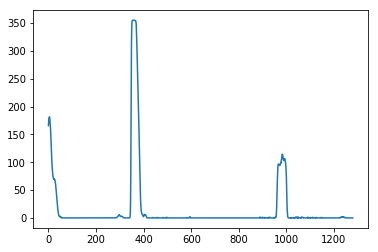

In [260]:
# Let's look at some of the plots

# For image of straighline 1
plt.plot(histogram_img(imgsw1))

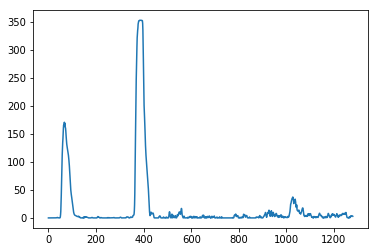

In [261]:
# for test image 1

plt.plot(histogram_img(imgw1))

Note : This image is particularly the hardest one to perform the task on, yet the results are decent for this

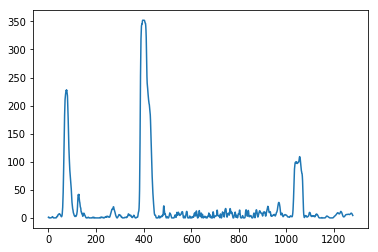

In [262]:
# for test image 4

plt.plot(histogram_img(imgw4))

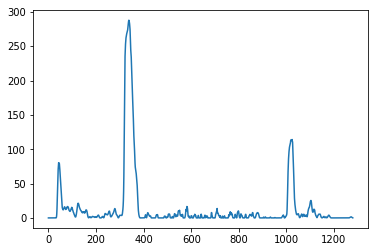

In [263]:
# for test image 5

plt.plot(histogram_img(imgw5))

Now let's try the sliding window approach, starting from the base positions that are identified by the histogram approach

In [264]:
def sliding_window_polyfit(img):
    
    histogram = histogram_img(img)
    
    # Determine the midpoint of the axes
    # Find the peak of the left and the right halves
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    # Choose the number of sliding windows ( For this case I choose 10 sliding windows)
    nwindows = 10
    
    # The height of the window is 
    window_height = np.int(img.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 80
    
    # Set minimum number of pixels found to recenter window
    minpix = 40
    
    